# Shows results for example image of wheat plot

In [117]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle
from PIL import Image

import import_ipynb
import wheat_dataset
from wheat_dataset import WheatDataset

from utils_dataset import get_transform_albumentation, get_transform_imgaug_img, get_transform_torch_img
from detection_transforms import Compose, PILToTensor, ConvertImageDtype, RandomHorizontalFlip
from detection_utils import collate_fn

import torch
import torchvision
from torchvision import transforms as T
from torchvision.utils import draw_segmentation_masks
from torchvision.utils import draw_bounding_boxes

import numpy as np
import math
import copy
import cv2
import os

# Functions

In [118]:
# prediction of model   ->    returns dictionary
def predict_image_window(model, image_window, score_threshold):
    # prediction
    image_window = Image.fromarray(image_window)
    image_window = get_transform_torch_img(image_window) / 255
    prediction = model([image_window])

    # save as tensor
    prediction[0]["boxes"] = torch.Tensor(prediction[0]["boxes"].cpu().detach().numpy())
    prediction[0]["scores"] = torch.Tensor(prediction[0]["scores"].cpu().detach().numpy())
    prediction[0]["labels"] = torch.Tensor(prediction[0]["labels"].cpu().detach().numpy())
    prediction[0]["masks"] = torch.Tensor(prediction[0]["masks"].cpu().detach().numpy())

    # remove predictions with small probability (score_threshold)
    prediction[0]["boxes"] = prediction[0]["boxes"][prediction[0]["scores"] > score_threshold]
    prediction[0]["labels"] = prediction[0]["labels"][:len(prediction[0]["boxes"])]
    prediction[0]["masks"] = prediction[0]["masks"][prediction[0]["scores"] > score_threshold]
    prediction[0]["scores"] = prediction[0]["scores"][:len(prediction[0]["boxes"])]

    return prediction[0]

In [119]:
# calculate center of bounding boxes   ->  returns x and y for bounding boxes as two lists
def get_box_center(boxes):
    x_center, y_center = [], []
    for box in boxes:
        x1, y1, x2, y2 = box
        x_mid = x1 + ((x2-x1) / 2)
        y_mid = y1 + ((y2-y1) / 2)
        x_center.append(x_mid)
        y_center.append(y_mid)
    return x_center, y_center

In [120]:
# get center of boxes for all predictions  ->  returns x and y for all predictions as two lists
def calc_all_box_centers(predictions):
    x_list, y_list = [], []
    for prediction in predictions:
        x_center, y_center = get_box_center(prediction["boxes"])
        x_list.append(x_center)
        y_list.append(y_center)
    return x_list, y_list

In [121]:
# returns a sigle list with bounding boxes of all predictions
def recalculate_bbs(predictions, num_columns):
    # maps every coordiante of bounding boxes of sliding window according to the position of the big image
    new_boxes = []
    for i, pred in enumerate(predictions):
        for box in pred["boxes"]:
            x1, y1, x2, y2 = box
            # 1st row
            if i < len(predictions) / num_columns:
                new_boxes.append(torch.stack([x1, y1+(i*240), x2, y2+(i*240)]))
            # 2nd row
            if (i >= len(predictions) / num_columns) and (i < len(predictions) / num_columns * 2):
                new_boxes.append(torch.stack([x1+120, y1+((i%7)*240), x2+120, y2+((i%7)*240)]))
            # 3rd row
            if i >= len(predictions) / num_columns * 2:
                new_boxes.append(torch.stack([x1+240, y1+((i%7)*240), x2+240, y2+((i%7)*240)]))
    return new_boxes

In [122]:
# calculates IoU between two boxes  ->   returns IoU and the bigger area of intersection as bool
def compute_iou(box1, box2):
    # coordinates of the intersection of the two bounding boxes
    x1 = max(box1[0], box2[0])
    y1 = max(box1[1], box2[1])
    x2 = min(box1[2], box2[2])
    y2 = min(box1[3], box2[3])

    # area of the intersection
    intersection = max(0, x2 - x1) * max(0, y2 - y1)

    # area of the union
    box1_area = (box1[2] - box1[0]) * (box1[3] - box1[1])
    box2_area = (box2[2] - box2[0]) * (box2[3] - box2[1])
    union = box1_area + box2_area - intersection
    
    # IoU
    iou = intersection / union

    return iou , box1_area > box2_area

In [123]:
# removes overlapping bounding boxes with "bad" IoU   ->    returns non overlappping boxes, mask and pixel area of the masks
def remove_overlapping_boxes(boxes, mask, threshold):
    # mask to filter out overlapping bounding boxes
    filtering_mask = torch.ones(boxes.shape[0], dtype=torch.bool)

    # iterate over the bounding boxes and check if they overlap with any other bounding box
    for i in range(boxes.shape[0]):
        for j in range(i + 1, boxes.shape[0]):
            iou, box1_area = compute_iou(boxes[i], boxes[j])
            if iou > threshold:
                if box1_area:
                    filtering_mask[j] = False
                else:
                    filtering_mask[i] = False
                
    # filter non overlapping bounding boxes and mask
    non_overlapping_boxes = boxes[filtering_mask]
    filtered_mask = mask[filtering_mask]

    # get pixel area of masks
    pixel_areas = []
    for mask in filtered_mask:
        pixel_areas.append(torch.sum(mask))

    return non_overlapping_boxes, filtered_mask, pixel_areas

In [124]:
# reconstructs mask for 520x1720 image and to filter for later purposes    ->     returns tensor of masks
def create_mask(predictions, num_columns):
    new_mask = []
    transform_pil = T.ToPILImage()
    transform_tensor = T.ToTensor()
    # iter over all 280x280 predictions
    for i, pred in enumerate(predictions):
        tmp = Image.new("L", (521, 1721))
        # iter over every mask for each prediction
        for k, mask in enumerate(pred["masks"]):
            mask = transform_pil(mask)
            index = i % int(len(predictions)/num_columns)
            # 1st row:      i < 7
            if i < len(predictions) / num_columns:
                tmp.paste(mask, (0, index*mask.size[1] - index*40))
            # 2nd row:      i >= 7 AND i < 14
            if (i >= len(predictions) / num_columns) and (i < len(predictions) / num_columns * 2):
                tmp.paste(mask, ((mask.size[1]-140) - 20, index*mask.size[1] - index*40))
            # 3rd row:      i >= 14
            if i >= len(predictions) / num_columns * 2:
                tmp.paste(mask, (mask.size[1] - 40, index*mask.size[1] - index*40))
            new_mask.append(transform_tensor(tmp))
    new_mask = torch.stack(new_mask).squeeze(1)
    return new_mask

In [125]:
# determines wheat heads for each area  ->  returns two lists of seperated x,y centres for each area and the areas themselfs
def density_division(modified_x, modified_y, width, height, WIDTH_PIXELS, HEIGHT_PIXELS, n_areas, pixel_areas, scaling_factor):
    outer_x, middle_x, inner_x = [], [], []
    outer_y, middle_y, inner_y = [], [], []
    outer_area, middle_area, inner_area = 0,0,0

    for i, x in enumerate(modified_x):
        # outer area
        if x <= WIDTH_PIXELS or x >= (width - WIDTH_PIXELS) or modified_y[i] <= HEIGHT_PIXELS or modified_y[i] >= (height - HEIGHT_PIXELS):
            outer_x.append(x)
            outer_y.append(modified_y[i])
            outer_area += pixel_areas[i]
        # inner area
        elif (x > (n_areas+scaling_factor)*WIDTH_PIXELS and x < width - ((n_areas+scaling_factor)*WIDTH_PIXELS)) and (modified_y[i] > n_areas*HEIGHT_PIXELS and modified_y[i] < height - (n_areas*HEIGHT_PIXELS)):
            inner_x.append(x)
            inner_y.append(modified_y[i])
            inner_area += pixel_areas[i]
        # middle area
        else:
            middle_x.append(x)
            middle_y.append(modified_y[i])
            middle_area += pixel_areas[i]

    return [outer_x, middle_x, inner_x], [outer_y, middle_y, inner_y], [outer_area, middle_area, inner_area]

In [126]:
# get counts of wheat heads for big image   ->     returns numpy array
def get_grid_counts(x_filtered, y_filtered, gridsize_heatmap, cells_w, cells_h):
    all_grids = []

    # iterate over all x,y coordiantes and count for each grid cell
    for i in range(len(x_filtered)):
        grid_counts = [[0 for j in range(cells_h)] for i in range(cells_w)]
        centers = zip(x_filtered, y_filtered)
        for x,y in centers:
            row_index = int(y // gridsize_heatmap)
            col_index = int(x // gridsize_heatmap)
            grid_counts[row_index][col_index] += 1
        all_grids.append(grid_counts)
    np_grids = [np.array(grid) for grid in all_grids]

    return np_grids[0].T

# Main Function and Plots

In [127]:
model_path = "C://Users//Emanuel//Programme//Bachelorarbeit//model//model_5_epochs_2022-12-14_v2.pt"
model = torch.load(model_path, map_location=torch.device('cpu'))

image_path = "C://Users//Emanuel//Desktop//full_plots//test_file_big_1.jpg"

image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
image = cv2.resize(image, dsize=(521, 1721))

In [128]:
score_threshold = 0.7
mask_threshold = 0.5

In [129]:
def main(model, image, score_threshold, mask_threshold):
    COLORS = [(255,0,0), (0,255,0), (0,0,255)]
    counter = 0

    # sliding window 
    images = []
    tmp = image
    step_size_width = 120
    step_size_heigth = 240
    num_columns = math.floor(image.shape[1] / (280-120))
    (w_width, w_height) = (280, 280)
    for x in range(0, image.shape[1] - w_width , step_size_width):       # width
        for y in range(0, image.shape[0] - w_height, step_size_heigth):    # heigth
            image_window = image[y:y + w_height, x:x + w_width, :]
            images.append(image_window)
            # cv2.rectangle(tmp, (x, y), (x + w_width, y + w_height), COLORS[counter], 2)   # show sub-image crops
        counter += 1

    # predictions for sliding window     
    predictions = []
    n_wheatheads = 0
    for i, image in enumerate(images, start=1):
        prediction = predict_image_window(model, image, score_threshold)
        predictions.append(prediction)

    # create mask
    mask = create_mask(predictions, num_columns)

    # filter overlapping boxes, masks and get wheat count
    recalculated_boxes = recalculate_bbs(predictions, num_columns)
    filtered_boxes, filtered_mask, pixel_areas = remove_overlapping_boxes(torch.stack(recalculated_boxes), mask, threshold=0.25)
    filtered_mask = filtered_mask.sum(dim=0) > mask_threshold
    x_filtered, y_filtered = get_box_center(filtered_boxes)

    n_wheatheads = len(filtered_boxes)

    return images, predictions, n_wheatheads, filtered_boxes, x_filtered, y_filtered, filtered_mask, pixel_areas

In [130]:
images, predictions, n_wheatheads, filtered_boxes, x_filtered, y_filtered, filtered_mask, pixel_areas = main(model, 
                                                                                                            image, 
                                                                                                            score_threshold, 
                                                                                                            mask_threshold)

# Plot of Image Predictions

In [131]:
# Plot image prediction
def image_plot(image, filtered_x, filtered_y, filtered_boxes, filtered_mask):
    image = image.transpose(1,0,2)
    total_wheatheads = len(filtered_x)

    transform = T.Compose([T.ToTensor(), T.ConvertImageDtype(torch.uint8)])
    torch_img = transform(image)

    torch_img_boxes = draw_bounding_boxes(torch_img.permute(0,2,1), filtered_boxes, colors=(255,0,0))
    torch_img_masks = draw_segmentation_masks(torch_img_boxes, filtered_mask, colors=(0,0,255), alpha=0.5).permute(2,1,0)

    # Plots normal image with boxes
    print(f"Total Wheat Heads: {total_wheatheads}")
    f1 = plt.figure(figsize=(30,16))
    ax = f1.add_subplot(1,1,1)
    plt.title(f"Image of big plot - Wheat count: {total_wheatheads}", fontsize=20)
    implot1 = plt.imshow(torch_img_masks)
    plt.show(block=True)

Total Wheat Heads: 931


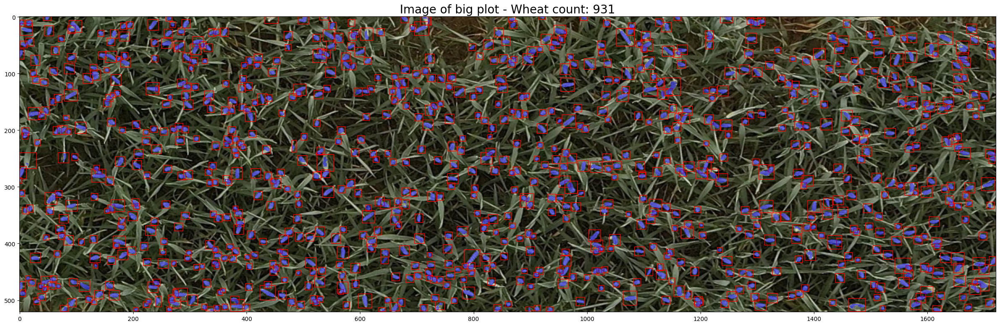

In [132]:
image_plot(image, x_filtered, y_filtered, filtered_boxes, filtered_mask)

In [133]:
gridsize_heatmap = 40
cells_w = int(1720 / gridsize_heatmap)
cells_h = int(520 / gridsize_heatmap)

In [134]:
np_grid = get_grid_counts(x_filtered, y_filtered, gridsize_heatmap, cells_w, cells_h)

# Plot of Heatmaps

In [135]:
# Plots count (and density) heatmap
def heatmaps(image, x_filtered, y_filtered, np_grid, gridsize_heatmap):
    row, column = np_grid.shape
    
    f1 = plt.figure(figsize=(30,16))
    f1.add_subplot(1,1,1)
    heatmap_big = plt.imshow(np_grid, cmap='YlOrRd')
    for i in range(row):
        for j in range(column):
            plt.text(j, i, np_grid[i][j], ha="center", va="center", color="black", fontsize=15)
    plt.title("Count heatmap for image of plot", fontsize=20)
    plt.yticks(ticks=np.arange(row), labels=["y{}".format(i+1) for i in range(row)])
    plt.xticks(ticks=np.arange(column), labels=["x{}".format(i+1) for i in range(column)])
    f1.colorbar(heatmap_big, shrink=0.5)
    plt.show(block=True)

    f2 = plt.figure(figsize=(30,16))
    f2.add_subplot(1,1,1)
    plt.title("Grid with wheat head center points for image of plot", fontsize=20)
    plt.plot(y_filtered, x_filtered, 'ro', markersize=3)
    implot3 = plt.imshow(image.transpose(1,0,2), extent=[0, 1721, 521, 0])
    for x in range(0, 1721, gridsize_heatmap):
        plt.plot([x, x], [0, 521], c='b', linewidth=1)
    for y in range(0, 521, gridsize_heatmap):
        plt.plot([0, 1721], [y, y], c='b', linewidth=1)

    plt.show(block=True)

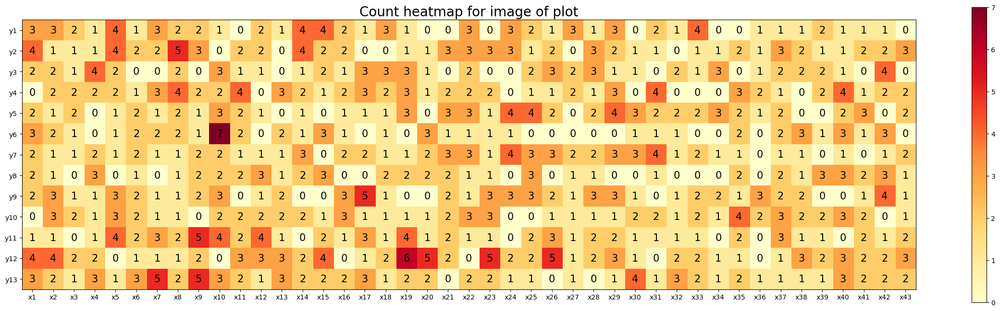

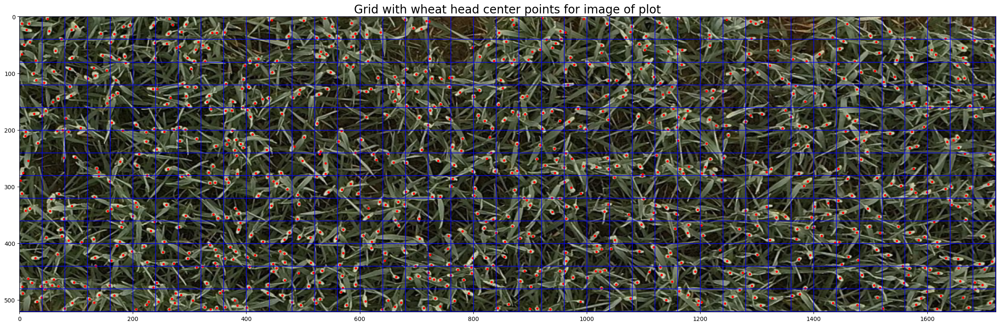

In [136]:
heatmaps(image, x_filtered, y_filtered, np_grid, gridsize_heatmap)

# Plot of gradient density map

In [165]:
# plots gradient density map
def plot_gradient_density(image, filtered_boxes, x_filtered, y_filtered, filtered_mask, pixel_areas):
    image = image.transpose(1,0,2)
    height, width, channels = image.shape

    WIDTH_PIXELS = math.floor(width*0.06)
    HEIGHT_PIXELS = math.floor(height*0.1)
    COLORS = ['ro', 'bo', 'mo']
    n_areas = 2
    scaling_factor = 1.44

    x, y, areas = density_division(y_filtered, x_filtered, width, height, WIDTH_PIXELS, HEIGHT_PIXELS, n_areas, pixel_areas, scaling_factor)

    red_c, blue_c, magenta_c = len(x[0]), len(x[1]), len(x[2]) 
    total_wheatheads = red_c + blue_c + magenta_c

    outer = Rectangle((1, 1), width-1, height-1, fill=False, color='r', linewidth=2)
    middle = Rectangle((WIDTH_PIXELS, HEIGHT_PIXELS), width-2*WIDTH_PIXELS, height-2*HEIGHT_PIXELS, fill=False, color='b', linewidth=2)
    inner = Rectangle((WIDTH_PIXELS*(n_areas+scaling_factor), HEIGHT_PIXELS*n_areas), width-n_areas*(n_areas+scaling_factor)*WIDTH_PIXELS, height-n_areas*n_areas*HEIGHT_PIXELS, fill=False, color='m', linewidth=2)

    outer_area = height*width - middle.get_window_extent().width*middle.get_window_extent().height
    middle_area = middle.get_window_extent().width*middle.get_window_extent().height - inner.get_window_extent().width*inner.get_window_extent().height
    inner_area = inner.get_window_extent().width*inner.get_window_extent().height

    # Plots divised image
    print()
    print(f"Division: Each sub-area is about 33% of the total area")
    f = plt.figure(figsize=(30,16))
    ax = f.add_subplot(1,1,1)
    plt.title(f"Density Division Image - Red: {len(x[0])}, Blue: {len(x[1])}, Magenta: {len(x[2])}", fontsize=20)
    for i in range(len(COLORS)):
        plt.plot(x[i], y[i], COLORS[i], markersize=4)
    implot2 = plt.imshow(image, extent=[0, width, height, 0])
    ax.add_patch(outer)
    ax.add_patch(middle)
    ax.add_patch(inner)
    plt.show(block=True)

    # Population Density for each region
    print(f"Magenta: {magenta_c} - {np.round(magenta_c/total_wheatheads*100, 3)}%")
    print(f"Blue: {blue_c} - {np.round(blue_c/total_wheatheads*100, 3)}%")
    print(f"Red: {red_c} - {np.round(red_c/total_wheatheads*100, 3)}%")
    print()
    print(f'Inner population density by count: {np.round(magenta_c/inner_area*100, 3)} wheat heads/pixel')
    print(f'Middle population density by count: {np.round(blue_c/middle_area*100, 3)} wheat heads/pixel')
    print(f'Outer population density by count: {np.round(red_c/outer_area*100, 3)} wheat heads/pixel')
    print()
    print(f'Inner population density by area: {np.round(float(areas[2])/inner_area*100, 3)}%')
    print(f'Middle population density by area: {np.round(float(areas[1])/middle_area*100, 3)}%')
    print(f'Outer population density by area: {np.round(float(areas[0])/outer_area*100, 3)}%')
    print()
    print(f"Total population density by count: {np.round((magenta_c+blue_c+red_c) / (inner_area + middle_area + outer_area) * 100, 3)} wheat heads/pixel")
    print(f"Total population density by area: {np.round((float(areas[2])+float(areas[1])+float(areas[0])) / (inner_area + middle_area + outer_area) * 100, 3)}%")


Division: Each sub-area is about 33% of the total area


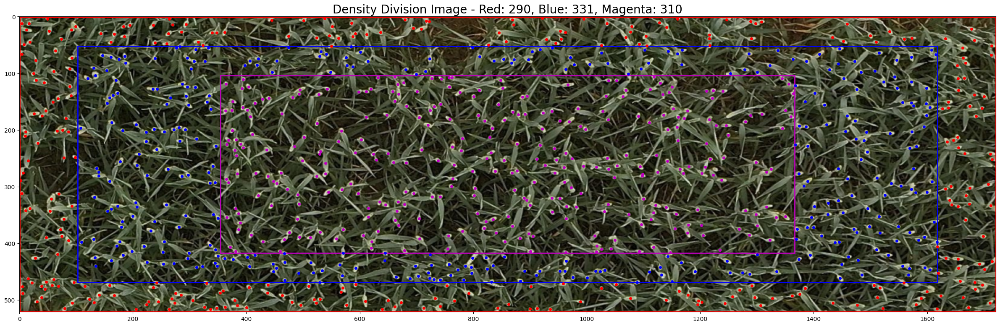

Magenta: 310 - 33.298%
Blue: 331 - 35.553%
Red: 290 - 31.149%

Inner population density by count: 0.098 wheat heads/pixel
Middle population density by count: 0.105 wheat heads/pixel
Outer population density by count: 0.109 wheat heads/pixel

Inner population density by area: 6.332%
Middle population density by area: 6.847%
Outer population density by area: 7.091%

Total population density by count: 0.104 wheat heads/pixel
Total population density by area: 6.737%


In [166]:
plot_gradient_density(image, filtered_boxes, x_filtered, y_filtered, filtered_mask, pixel_areas)